In [1]:
import pandas as pd
import missingno
import matplotlib.pyplot as plt
import folium # pip install folium
from folium.plugins import MarkerCluster

In [2]:
pd.set_option('display.max_columns', None)
df = pd.read_csv("globalterrorismdb_0718dist.csv", low_memory=False)

In [3]:
df.head()

,eventid,iyear,imonth,iday,approxdate,extended,resolution,country,country_txt,region,region_txt,provstate,city,latitude,longitude,specificity,vicinity,location,summary,crit1,crit2,crit3,doubtterr,alternative,alternative_txt,multiple,success,suicide,attacktype1,attacktype1_txt,attacktype2,attacktype2_txt,attacktype3,attacktype3_txt,targtype1,targtype1_txt,targsubtype1,targsubtype1_txt,corp1,target1,natlty1,natlty1_txt,targtype2,targtype2_txt,targsubtype2,targsubtype2_txt,corp2,target2,natlty2,natlty2_txt,targtype3,targtype3_txt,targsubtype3,targsubtype3_txt,corp3,target3,natlty3,natlty3_txt,gname,gsubname,gname2,gsubname2,gname3,gsubname3,motive,guncertain1,guncertain2,guncertain3,individual,nperps,nperpcap,claimed,claimmode,claimmode_txt,claim2,claimmode2,claimmode2_txt,claim3,claimmode3,claimmode3_txt,compclaim,weaptype1,weaptype1_txt,weapsubtype1,weapsubtype1_txt,weaptype2,weaptype2_txt,weapsubtype2,weapsubtype2_txt,weaptype3,weaptype3_txt,weapsubtype3,weapsubtype3_txt,weaptype4,weaptype4_txt,weapsubtype4,weapsubtype4_txt,weapdetail,nkill,nkillus,nkillter,nwound,nwoundus,nwoundte,property,propextent,propextent_txt,propvalue,propcomment,ishostkid,nhostkid,nhostkidus,nhours,ndays,divert,kidhijcountry,ransom,ransomamt,ransomamtus,ransompaid,ransompaidus,ransomnote,hostkidoutcome,hostkidoutcome_txt,nreleased,addnotes,scite1,scite2,scite3,dbsource,INT_LOG,INT_IDEO,INT_MISC,INT_ANY,related
0,197000000001,1970,7,2,NaN,0,NaN,58,Dominican Republic,2,Central America & Caribbean,NaN,Santo Domingo,18.456792,-69.951164,1.0,0,NaN,NaN,1,1,1,0.0,NaN,NaN,0.0,1,0,1,Assassination,NaN,NaN,NaN,NaN,14,Private Citizens & Property,68.0,Named Civilian,NaN,Julio Guzman,58.0,Dominican Republic,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,MANO-D,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,13,Unknown,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,0.0,NaN,NaN,0,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PGIS,0,0,0,0,NaN
1,197000000002,1970,0,0,NaN,0,NaN,130,Mexico,1,North America,Federal,Mexico city,19.371887,-99.086624,1.0,0,NaN,NaN,1,1,1,0.0,NaN,NaN,0.0,1,0,6,Hostage Taking (Kidnapping),NaN,NaN,NaN,NaN,7,Government (Diplomatic),45.0,"Diplomatic Personnel (outside of embassy, cons...",Belgian Ambassador Daughter,"Nadine Chaval, daughter",21.0,Belgium,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,23rd of September Communist League,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,0,7.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,13,Unknown,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,0.0,NaN,NaN,0,NaN,NaN,NaN,NaN,1.0,1.0,0.0,NaN,NaN,NaN,Mexico,1.0,800000.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PGIS,0,1,1,1,NaN
2,197001000001,1970,1,0,NaN,0,NaN,160,Philippines,5,Southeast Asia,Tarlac,Unknown,15.478598,120.599741,4.0,0,NaN,NaN,1,1,1,0.0,NaN,NaN,0.0,1,0,1,Assassination,NaN,NaN,NaN,NaN,10,Journalists & Media,54.0,Radio Journalist/Staff/Facility,Voice of America,Employee,217.0,United States,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Unknown,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,13,Unknown,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,0.0,NaN,NaN,0,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,PGIS,-9,-9,1,1,NaN
3,197001000002,1970,1,0,NaN,0,NaN,78,Greece,8,Western Europe,Attica,Athens,37.997490,23.762728,1.0,0,NaN,NaN,1,1,1,0.0,NaN,NaN,0.0,1,0,3,Bombing/Explosion,NaN,NaN,NaN,NaN,7,Government (Diplomatic),46.0,Embassy/Consulate,NaN,U.S. Embassy,217.0,United States,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Unknown,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6,Explosives,16.0,Unknown Explosive Type,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Explosive,NaN,NaN,NaN,NaN,NaN,NaN,1,NaN

In [4]:
df.shape

(181691, 135)

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 181691 entries, 0 to 181690
Columns: 135 entries, eventid to related
dtypes: float64(55), int64(22), object(58)
memory usage: 187.1+ MB


### There are too many columns. Let´s check if we will use all of them. 

In [6]:
# select some relevant columns 
df = df[['eventid','iyear','imonth','iday','region_txt','country_txt','city','latitude','longitude','success','suicide','attacktype1_txt','targtype1_txt','target1','natlty1_txt','gname','motive','weaptype1_txt','weapdetail','nkill','nwound','nhostkid']]

In [7]:
# % of columns without values
df.isna().sum() / len(df) * 100

eventid             0.000000
iyear               0.000000
imonth              0.000000
iday                0.000000
region_txt          0.000000
country_txt         0.000000
city                0.238867
latitude            2.507554
longitude           2.508104
success             0.000000
suicide             0.000000
attacktype1_txt     0.000000
targtype1_txt       0.000000
target1             0.350045
natlty1_txt         0.858050
gname               0.000000
motive             72.171984
weaptype1_txt       0.000000
weapdetail         37.244553
nkill               5.676120
nwound              8.977330
nhostkid           92.530175
dtype: float64

<AxesSubplot:>

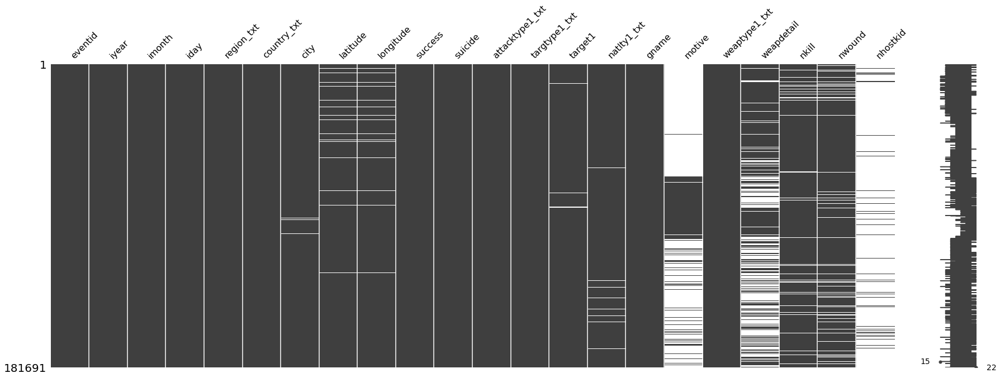

In [8]:
# visualizing if it has null values
missingno.matrix(df, figsize=(30,10))

In [9]:
df.columns

Index(['eventid', 'iyear', 'imonth', 'iday', 'region_txt', 'country_txt',
       'city', 'latitude', 'longitude', 'success', 'suicide',
       'attacktype1_txt', 'targtype1_txt', 'target1', 'natlty1_txt', 'gname',
       'motive', 'weaptype1_txt', 'weapdetail', 'nkill', 'nwound', 'nhostkid'],
      dtype='object')

In [10]:
df.head()

,eventid,iyear,imonth,iday,region_txt,country_txt,city,latitude,longitude,success,suicide,attacktype1_txt,targtype1_txt,target1,natlty1_txt,gname,motive,weaptype1_txt,weapdetail,nkill,nwound,nhostkid
0,197000000001,1970,7,2,Central America & Caribbean,Dominican Republic,Santo Domingo,18.456792,-69.951164,1,0,Assassination,Private Citizens & Property,Julio Guzman,Dominican Republic,MANO-D,NaN,Unknown,NaN,1.0,0.0,NaN
1,197000000002,1970,0,0,North America,Mexico,Mexico city,19.371887,-99.086624,1,0,Hostage Taking (Kidnapping),Government (Diplomatic),"Nadine Chaval, daughter",Belgium,23rd of September Communist League,NaN,Unknown,NaN,0.0,0.0,1.0
2,197001000001,1970,1,0,Southeast Asia,Philippines,Unknown,15.478598,120.599741,1,0,Assassination,Journalists & Media,Employee,United States,Unknown,NaN,Unknown,NaN,1.0,0.0,NaN
3,197001000002,1970,1,0,Western Europe,Greece,Athens,37.997490,23.762728,1,0,Bombing/Explosion,Government (Diplomatic),U.S. Embassy,United States,Unknown,NaN,Explosives,Explosive,NaN,NaN,NaN
4,197001000003,1970,1,0,East Asia,Japan,Fukouka,33.580412,130.396361,1,0,Facility/Infrastructure Attack,Government (Diplomatic),U.S. Consulate,United States,Unknown,NaN,Incendiary,Incendiary,NaN,NaN,NaN


## Data Analysis

- ### How many terrorist attacks it has in each city

In [14]:
df['city'].value_counts()

Unknown           9775
Baghdad           7589
Karachi           2652
Lima              2359
Mosul             2265
                  ... 
Kotka                1
Narva-Joesuu         1
Muizenberg           1
Oum El Bouaghi       1
Waitara              1
Name: city, Length: 36674, dtype: int64

- ### How many terrorist attacks it has in each country

In [ ]:
df['country_txt'].value_counts()

- ### How many terrorist attacks it has in each Region

In [15]:
df['region_txt'].value_counts()

Middle East & North Africa     50474
South Asia                     44974
South America                  18978
Sub-Saharan Africa             17550
Western Europe                 16639
Southeast Asia                 12485
Central America & Caribbean    10344
Eastern Europe                  5144
North America                   3456
East Asia                        802
Central Asia                     563
Australasia & Oceania            282
Name: region_txt, dtype: int64

- ### The name of the terrorist groups involved

In [16]:
df['gname'].unique()

array(['MANO-D', '23rd of September Communist League', 'Unknown', ...,
       'Fatoni Warriors', 'Minorities of Metropolitan Attacks',
       'Baloch Republican Party'], dtype=object)

- ### The weapons that are used using during the terrorism 

In [17]:
df['weaptype1_txt'].unique()

array(['Unknown', 'Explosives', 'Incendiary', 'Firearms', 'Chemical',
       'Melee', 'Sabotage Equipment',
       'Vehicle (not to include vehicle-borne explosives, i.e., car or truck bombs)',
       'Fake Weapons', 'Radiological', 'Other', 'Biological'],
      dtype=object)

- ### The type of attack used using during the terrorism 

In [18]:
df['attacktype1_txt'].unique()

array(['Assassination', 'Hostage Taking (Kidnapping)',
       'Bombing/Explosion', 'Facility/Infrastructure Attack',
       'Armed Assault', 'Hijacking', 'Unknown', 'Unarmed Assault',
       'Hostage Taking (Barricade Incident)'], dtype=object)

## Let's create some plots to analys

In [19]:
df.columns

Index(['eventid', 'iyear', 'imonth', 'iday', 'region_txt', 'country_txt',
       'city', 'latitude', 'longitude', 'success', 'suicide',
       'attacktype1_txt', 'targtype1_txt', 'target1', 'natlty1_txt', 'gname',
       'motive', 'weaptype1_txt', 'weapdetail', 'nkill', 'nwound', 'nhostkid'],
      dtype='object')

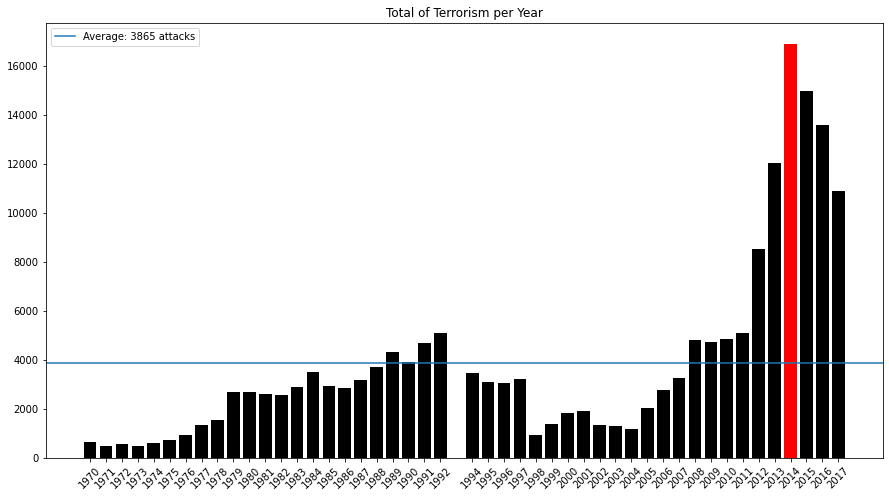

In [69]:
y = df['iyear'].groupby(df['iyear']).count()
x = y.index
mean_attack = int(y.mean())

plt.figure(figsize = (15,8))
plt.xticks(rotation = 45)
plt.title("Total of Terrorism per Year")
plt.xticks(x)
plt.bar(x,y,color=['black' if (x < max(y)) else 'red' for x in y ])
plt.axhline(mean_attack, label=f"Average: {mean_attack} attacks")
plt.legend()
plt.show()

- ### The year with more terrorist attacks was 2014

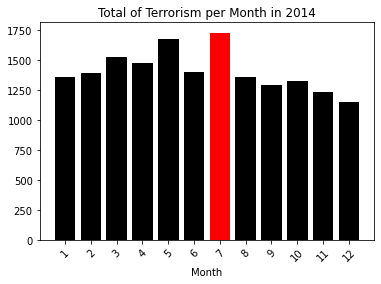

In [70]:
df_2014 = df[df['iyear'] == 2014]
y = df_2014['imonth'].groupby(df_2014['imonth']).count()
x = y.index

plt.xticks(rotation = 45)
plt.title("Total of Terrorism per Month in 2014")
plt.xticks(x)
plt.xlabel("Month")
plt.bar(x,y,color=['black' if (x < max(y)) else 'red' for x in y ])
plt.show()

- ### The months with more terrorist attacks was July

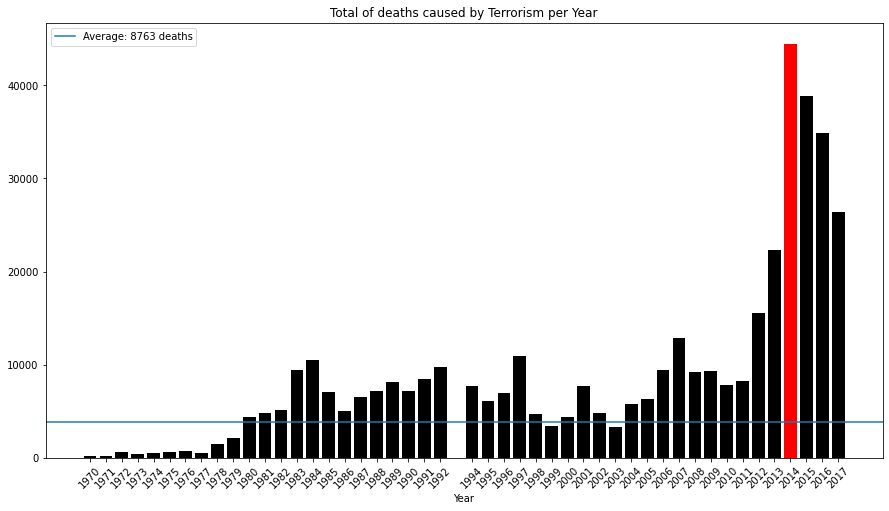

In [71]:
y = df['nkill'].groupby(df['iyear']).sum()
x = y.index
mean_death = int(y.mean())

plt.figure(figsize = (15,8))
plt.xticks(rotation = 45)
plt.title("Total of deaths caused by Terrorism per Year")
plt.xticks(x)
plt.xlabel("Year")
plt.bar(x,y,color=['black' if (x < max(y)) else 'red' for x in y ])
plt.axhline(mean_attack, label=f"Average: {mean_death} deaths")
plt.legend()
plt.show()

- ### The year with more attacks was the year with more deaths as well

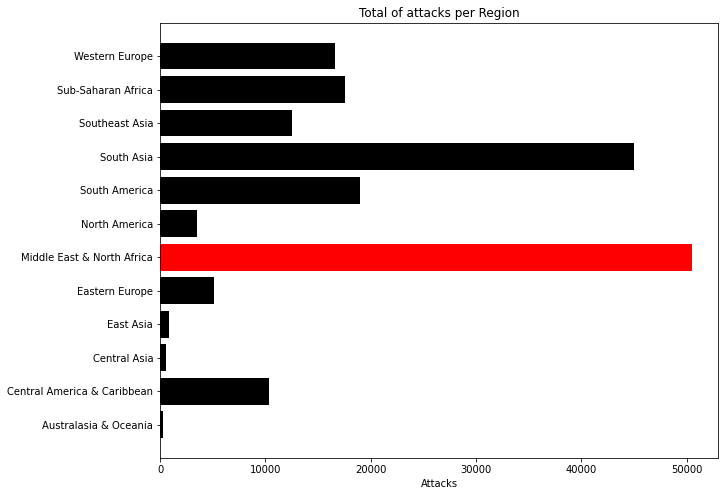

In [72]:
y = df['eventid'].groupby(df['region_txt']).count()
x = y.index

plt.figure(figsize = (10,8))
plt.title("Total of attacks per Region")

plt.xlabel("Attacks")
plt.barh(x,y,color=['black' if (x < max(y)) else 'red' for x in y ])
plt.show()

- ### The Region with more attacks was Middle East & North Africa

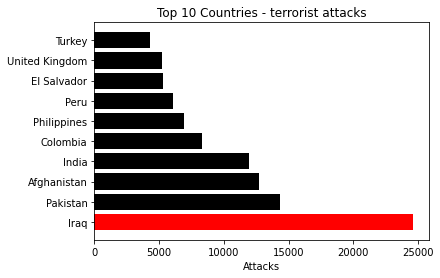

In [73]:
y = df['eventid'].groupby(df['country_txt']).count()
y.sort_values(ascending=False, inplace=True)
x = y.index

plt.title("Top 10 Countries - terrorist attacks")

plt.xlabel("Attacks")
plt.barh(x[:10],y[:10],color=['black' if (x < max(y)) else 'red' for x in y ])
plt.show()

- ### The Country that suffered more terrorist attacks was Iraq

In [25]:
# Here let´s check the attacks on 2014(the year with more attacks) on map using the longitude
filterData = df_2014 

# We are getting the required fields
reqFilterData = filterData.loc[:,'city':'longitude'] 
# drop NaN values in latitude and longitude
reqFilterData = reqFilterData.dropna() 
reqFilterDataList = reqFilterData.values.tolist()

# Show the data on the map using folium
map = folium.Map(location = [0, 30], tiles="Stamen Toner", zoom_start=2) # we can use tiles='CartoDB positron' 

# clustered marker
markerCluster = folium.plugins.MarkerCluster().add_to(map)
for point in range(0, len(reqFilterDataList)):
    folium.Marker(location=[reqFilterDataList[point][1],reqFilterDataList[point][2]],
                  popup = reqFilterDataList[point][0]).add_to(markerCluster)
map

- ### When we visualize on the map is easier to see the countries that suffered more terrorist attacks. Middle East is the Region that receive more attacks comparing to all other regions in 2014.

In [26]:
df_2014_region = df_2014.groupby(['iyear','region_txt'])[['nkill','nwound','eventid']].agg({'nkill':'sum','nwound':'sum','eventid':'count'})
df_2014_region['%attack'] = df_2014_region['eventid'] / df_2014_region['eventid'].sum() * 100
df_2014_region['avgwounddeathperattack'] = (df_2014_region['nkill'] + df_2014_region['nwound']) / df_2014_region['eventid'] 
df_2014_region

nkill   nwound  eventid    %attack  \
iyear region_txt                                                          
2014  Australasia & Oceania            4.0      7.0        9   0.053245   
      Central America & Caribbean      5.0     65.0        5   0.029581   
      Central Asia                     5.0      7.0        9   0.053245   
      East Asia                      322.0    478.0       43   0.254393   
      Eastern Europe                1467.0   1329.0      962   5.691297   
      Middle East & North Africa   20080.0  22601.0     6939  41.051884   
      North America                   34.0     27.0       37   0.218896   
      South America                  157.0    355.0      283   1.674259   
      South Asia                    8358.0   9461.0     4998  29.568716   
      Southeast Asia                 702.0   1451.0     1082   6.401231   
      Sub-Saharan Africa           13351.0   5316.0     2321  13.731290   
      Western Europe                   5.0     31.0      215   1.271964   

                                   avgwounddeathperattack  
iyear region_txt                                           
2014  Australasia & Oceania                      1.222222  
      Central America & Caribbean               14.000000  
      Central Asia                               1.333333  
      East Asia                                 18.604651  
      Eastern Europe                             2.906445  
      Middle East & North Africa                 6.150886  
      North America                              1.648649  
      South America                              1.809187  
      South Asia                                 3.565226  
      Southeast Asia                             1.989834  
      Sub-Saharan Africa                         8.042654  
      Western Europe                             0.167442

- ### Above we can see that Middle East & North Africa correspond 41% of all attacks in 2014 with an average of 6 person of death or wound per attack

In [27]:
df.columns

Index(['eventid', 'iyear', 'imonth', 'iday', 'region_txt', 'country_txt',
       'city', 'latitude', 'longitude', 'success', 'suicide',
       'attacktype1_txt', 'targtype1_txt', 'target1', 'natlty1_txt', 'gname',
       'motive', 'weaptype1_txt', 'weapdetail', 'nkill', 'nwound', 'nhostkid'],
      dtype='object')

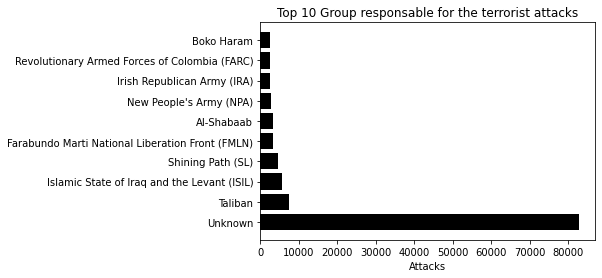

In [28]:
y = df['eventid'].groupby(df['gname']).count()
y.sort_values(ascending=False, inplace=True)
x = y.index

plt.title("Top 10 Group responsable for the terrorist attacks")
plt.xlabel("Attacks")
plt.barh(x[:10],y[:10],color="black")
plt.show()

# getting the top 3 group with more numbers of attacks
top3_group = y.index[:3]

- ### Most attacks are from unconfirmed or unknown groups. Taliban group is responsible for 7478 attacks.

In [29]:
# Let´s check the top 3 groups. What kind of attack and weapon did they use
df_top3_group = df[df['gname'].isin(top3_group)]
df_top3_group = df_top3_group.groupby(['gname','attacktype1_txt','weaptype1_txt']).count().reset_index()
df_top3_group.sort_values(by='eventid', ascending=False).head(10)

,gname,attacktype1_txt,weaptype1_txt,eventid,iyear,imonth,iday,region_txt,country_txt,city,latitude,longitude,success,suicide,targtype1_txt,target1,natlty1_txt,motive,weapdetail,nkill,nwound,nhostkid
86,Unknown,Bombing/Explosion,Explosives,46540,46540,46540,46540,46540,46540,46438,46045,46044,46540,46540,46540,46392,45854,13916,31155,45135,44614,26
71,Unknown,Armed Assault,Firearms,14538,14538,14538,14538,14538,14538,14355,14276,14276,14538,14538,14538,14513,14494,5406,6983,14149,13792,140
79,Unknown,Assassination,Firearms,6372,6372,6372,6372,6372,6372,6366,6269,6269,6372,6372,6372,6358,6336,1151,4091,6361,6252,66
9,Islamic State of Iraq and the Levant (ISIL),Bombing/Explosion,Explosives,3643,3643,3643,3643,3643,3643,3643,3637,3637,3643,3643,3643,3643,3638,448,1646,3507,3368,0
98,Unknown,Facility/Infrastructure Attack,Incendiary,3367,3367,3367,3367,3367,3367,3360,3329,3329,3367,3367,3367,3356,3335,1144,2317,3191,3180,8
40,Taliban,Bombing/Explosion,Explosives,2863,2863,2863,2863,2863,2863,2849,2856,2856,2863,2863,2863,2857,2640,828,1903,2844,2796,1
31,Taliban,Armed Assault,Firearms,1987,1987,1987,1987,1987,1987,1963,1986,1986,1987,1987,1987,1984,1985,472,288,1939,1818,22
119,Unknown,Hostage Taking (Kidnapping),Firearms,1854,1854,1854,1854,1854,1854,1850,1818,1818,1854,1854,1854,1851,1849,684,676,1383,1329,1781
78,Unknown,Assassination,Explosives,1792,1792,1792,1792,1792,1792,1786,1772,1772,1792,1792,1792,1792,1789,590,1401,1778,1763,0
136,Unknown,Unknown,Unknown,1526,1526,1526,1526,1526,1526,1517,1445,1445,1526,1526,1526,1521,1496,248,216,1420,1378,9


- ### If we take a look in the top 3 group we can observe that the most common type of attack used were Bombing/Explosion(explosives) and Armed Assault(firearms).

## Conclusion:
### With a quick analysis of the dataset we observe that in the period from 1970 to 2017
- The average number of attack was 3865 per year
- The average number of deaths was 8763 per year
- Year with more attacks and deaths: 2014
- Region with more attacks: Middle East
- Country with more attacks: Iraq
- City with more attacks: Baghdad
- Explosives and Firearms were the most common weapons used
- The terrorist group with more attacks that was identified was Taliban

### The year 1993 has no information